# Style Transfer Using 

The goal of this project is to build and train a model that transfers the style of one image onto another. 

This project will implement Adaptive Instance Normalization (AdaIN), a layer that attempts to transfer styles of images in real time. 

The goal is to create e neural network that is not fixed to a singular trained style. 

Source for AdaIN paper: https://arxiv.org/abs/1703.06868

### EDA
Image data sources
- Art: https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time
- Images: https://www.tensorflow.org/datasets/catalog/voc

In [3]:
import numpy as np 
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import random

%matplotlib inline

In [5]:
# art data has many different artists, we will just look at a few folders for the EDA

warhol = "archive/images/images/Andy_Warhol"
caravaggio = "archive/images/images/Caravaggio"
dali = "archive/images/images/Salvador_Dali"

In [9]:
# taking a look at some images
def display_random_images(image_dir, num_images=10, rows=2, cols=5):
    image_ids = os.listdir(image_dir)
    np.random.shuffle(image_ids)
    image_ids = image_ids[:num_images]
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6))
    
    for i, filename in enumerate(image_ids):
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        row = i // cols
        col = i % cols
        
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        axes[row, col].set_title(f'Image {i+1}')
    
    plt.tight_layout()
    plt.show()

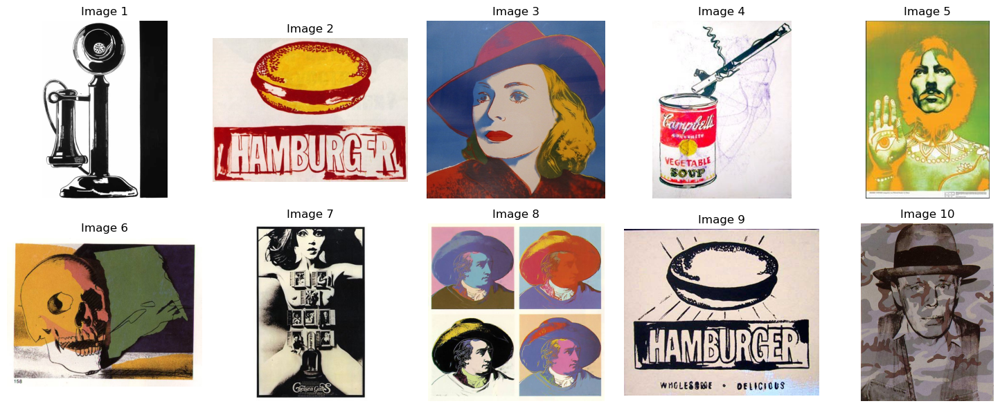

In [11]:
display_random_images(warhol)

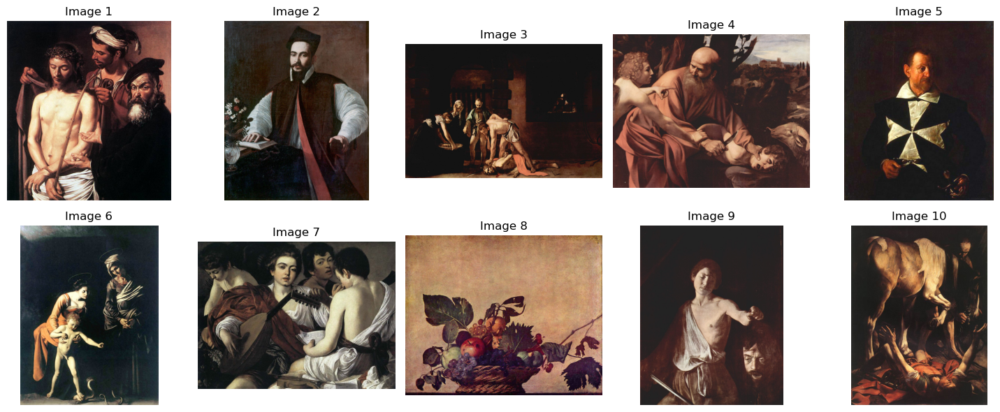

In [13]:
display_random_images(caravaggio)

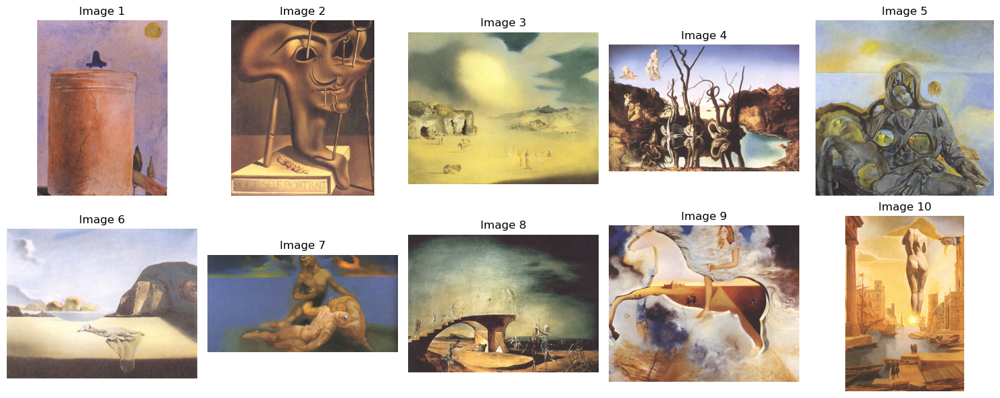

In [15]:
display_random_images(dali)

In [19]:
# function to plot histogram of random images
def plot_random_image_and_histogram(folder_path):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    
    if not image_files:
        print("No images found in the folder.")
        return
    
    random_image_file = random.choice(image_files)
    random_image_path = os.path.join(folder_path, random_image_file)
    
    image = cv2.imread(random_image_path)
    
    if image is None:
        print(f"Failed to load image: {random_image_path}")
        return
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10, 4))
    
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title(f'Random Image: {random_image_file}')
    plt.axis('off')
    
    channels = ('r', 'g', 'b')
    colors = ('red', 'green', 'blue')
    
    plt.subplot(1, 2, 2)
    
    for i, color in enumerate(colors):
        histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(histogram, color=color)
        plt.xlim([0, 256])
    
    plt.title('RGB Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

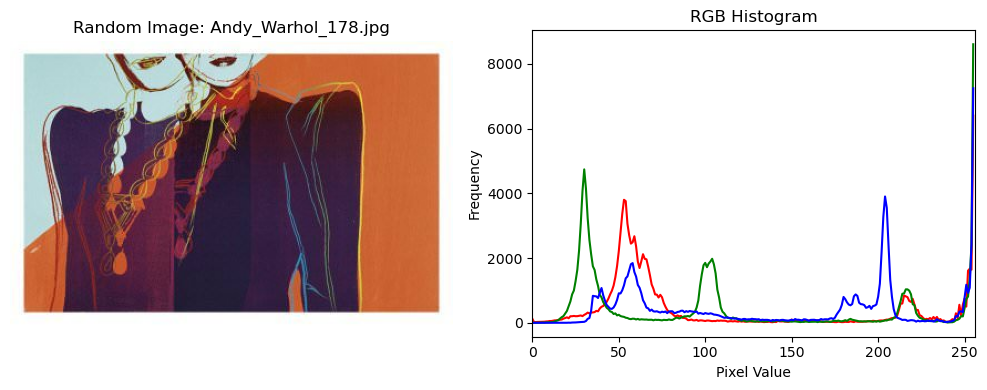

In [21]:
plot_random_image_and_histogram(warhol)

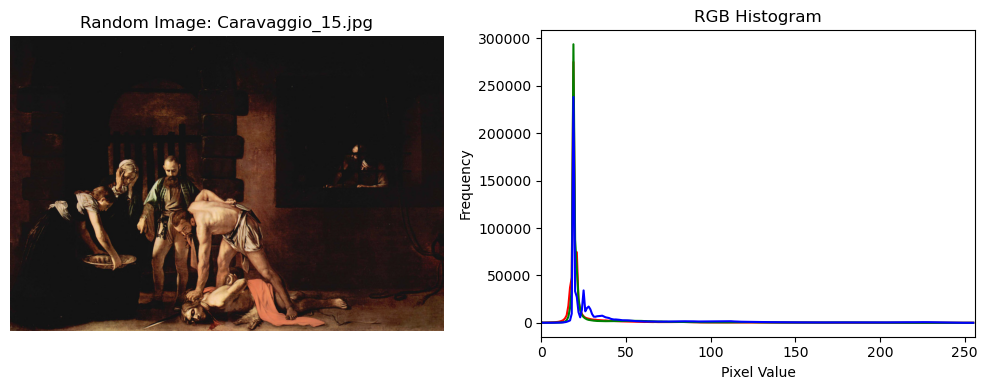

In [23]:
plot_random_image_and_histogram(caravaggio)

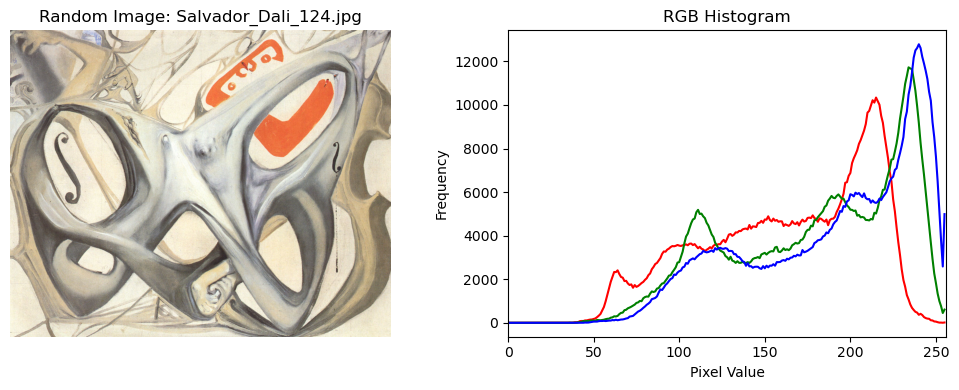

In [84]:
plot_random_image_and_histogram(dali)

### Analysis of RGB plots ^^^

The two different styles of artists are strikingly different when it comes to the applied color spectrum (obviously). However, this is part of 
the challenge, being able to apply different styles to real life images in real time. 

### PCA to see dimensionality differences between art styles: Warhol and Caravaggio

In [27]:
from sklearn.decomposition import PCA

def load_images(folder_path, limit=None):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    
    if limit:
        image_files = image_files[:limit]
    
    images = []
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        
        if image is not None:
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            images.append(image_rgb)
    
    return images

def extract_rgb_values(images):
    rgb_values = []
    
    for image in images:
        reshaped_image = image.reshape(-1, 3)
        rgb_values.append(reshaped_image)
    
    return np.vstack(rgb_values)

def apply_pca_and_plot(monet_images, photos_images, n_components=2):
    monet_rgb_values = extract_rgb_values(monet_images)
    photos_rgb_values = extract_rgb_values(photos_images)
    
    all_rgb_values = np.vstack([monet_rgb_values, photos_rgb_values])
    
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(all_rgb_values)
    
    monet_pca_result = pca_result[:len(monet_rgb_values)]
    photos_pca_result = pca_result[len(monet_rgb_values):]
    
    fig, axs = plt.subplots(1, 2, figsize=(14, 7))
    
    if n_components == 2:
        axs[0].scatter(monet_pca_result[:, 0], monet_pca_result[:, 1], label='Monet', alpha=0.5, color='blue')
        axs[0].set_title('PCA of Monet Paintings')
        axs[0].set_xlabel('PCA Component 1')
        axs[0].set_ylabel('PCA Component 2')
        axs[0].legend()
        
        axs[1].scatter(photos_pca_result[:, 0], photos_pca_result[:, 1], label='Photos', alpha=0.5, color='green')
        axs[1].set_title('PCA of Regular Photos')
        axs[1].set_xlabel('PCA Component 1')
        axs[1].set_ylabel('PCA Component 2')
        axs[1].legend()
        
    elif n_components == 3:
        from mpl_toolkits.mplot3d import Axes3D
        
        ax1 = fig.add_subplot(121, projection='3d')
        ax1.scatter(monet_pca_result[:, 0], monet_pca_result[:, 1], monet_pca_result[:, 2], label='Monet', alpha=0.5, color='blue')
        ax1.set_title('PCA of Monet Paintings')
        ax1.set_xlabel('PCA Component 1')
        ax1.set_ylabel('PCA Component 2')
        ax1.set_zlabel('PCA Component 3')
        ax1.legend()
        
        ax2 = fig.add_subplot(122, projection='3d')
        ax2.scatter(photos_pca_result[:, 0], photos_pca_result[:, 1], photos_pca_result[:, 2], label='Photos', alpha=0.5, color='green')
        ax2.set_title('PCA of Regular Photos')
        ax2.set_xlabel('PCA Component 1')
        ax2.set_ylabel('PCA Component 2')
        ax2.set_zlabel('PCA Component 3')
        ax2.legend()
    
    plt.tight_layout()
    plt.show()

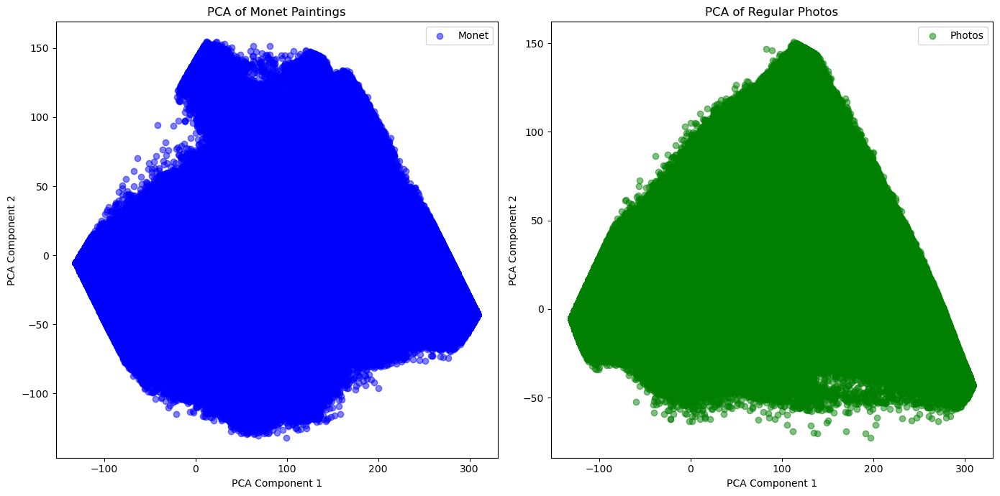

In [29]:
warhol_images = load_images(warhol, limit=10)
caravaggio_images = load_images(caravaggio, limit=10)

# apply PCA and plot. Using small sample size to avoid kernel dying
apply_pca_and_plot(warhol_images, caravaggio_images, n_components=2)

### analysis of PCA
Sample size was small; however, considering that each artist has a uniform style, we will assume it is a decent representation of the features 
across all images. Warhol covers a larger spectrum, this is perhaps due to the vibrant nature of his paintings where as Caravaggio is known for his dark 
paintings. 

## Building Model
We will use a pre-trained model VGG16 as well as introducing the AdaIN layer. The goal here is a combination of transfer learning as well 
as style transferring in real time. 

In [49]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

EPOCHS = 1
AUTOTUNE = tf.data.AUTOTUNE

In [50]:
def decode_and_resize(image_path):
# decode and resize images
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, dtype="float32")
    image = tf.image.resize(image, IMAGE_SIZE)
    return image


def extract_image_from_voc(element):
    image = element["image"]
    image = tf.image.convert_image_dtype(image, dtype="float32")
    image = tf.image.resize(image, IMAGE_SIZE)
    return image


style_images = os.listdir("archive/resized/resized")
style_images = [os.path.join("archive/resized/resized", path) for path in style_images]

total_style_images = len(style_images)
train_style = style_images[: int(0.8 * total_style_images)]
val_style = style_images[int(0.8 * total_style_images) : int(0.9 * total_style_images)]
test_style = style_images[int(0.9 * total_style_images) :]

train_style_ds = (
    tf.data.Dataset.from_tensor_slices(train_style)
    .map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    .repeat()
)
train_content_ds = tfds.load("voc", split="train").map(extract_image_from_voc).repeat()

val_style_ds = (
    tf.data.Dataset.from_tensor_slices(val_style)
    .map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    .repeat()
)
val_content_ds = (
    tfds.load("voc", split="validation").map(extract_image_from_voc).repeat()
)

test_style_ds = (
    tf.data.Dataset.from_tensor_slices(test_style)
    .map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    .repeat()
)
test_content_ds = (
    tfds.load("voc", split="test")
    .map(extract_image_from_voc, num_parallel_calls=AUTOTUNE)
    .repeat()
)

train_ds = (
    tf.data.Dataset.zip((train_style_ds, train_content_ds))
    .shuffle(BATCH_SIZE * 2)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

val_ds = (
    tf.data.Dataset.zip((val_style_ds, val_content_ds))
    .shuffle(BATCH_SIZE * 2)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

test_ds = (
    tf.data.Dataset.zip((test_style_ds, test_content_ds))
    .shuffle(BATCH_SIZE * 2)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

2024-06-24 21:08:27.600210: W external/local_tsl/tsl/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "NOT_FOUND: Could not locate the credentials file.". Retrieving token from GCE failed with "FAILED_PRECONDITION: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata.google.internal".


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter serve

Shuffling /Users/sethmartin/tensorflow_datasets/voc/2007/incomplete.RJFTTW_4.0.0/voc-test.tfrecord*...:   0%| …

Generating train examples...:   0%|          | 0/2501 [00:00<?, ? examples/s]

Shuffling /Users/sethmartin/tensorflow_datasets/voc/2007/incomplete.RJFTTW_4.0.0/voc-train.tfrecord*...:   0%|…

Generating validation examples...:   0%|          | 0/2510 [00:00<?, ? examples/s]

Shuffling /Users/sethmartin/tensorflow_datasets/voc/2007/incomplete.RJFTTW_4.0.0/voc-validation.tfrecord*...: …

Dataset voc downloaded and prepared to /Users/sethmartin/tensorflow_datasets/voc/2007/4.0.0. Subsequent calls will reuse this data.


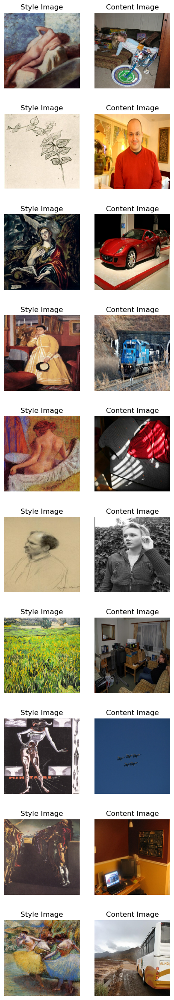

In [53]:
style, content = next(iter(train_ds))
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(5, 30))
[ax.axis("off") for ax in np.ravel(axes)]

for (axis, style_image, content_image) in zip(axes, style[0:10], content[0:10]):
    (ax_style, ax_content) = axis
    ax_style.imshow(style_image)
    ax_style.set_title("Style Image")

    ax_content.imshow(content_image)
    ax_content.set_title("Content Image")

In [65]:
def get_encoder():
    vgg19 = keras.applications.VGG19(
        include_top=False,
        weights="imagenet",
        input_shape=(*IMAGE_SIZE, 3),
    )
    vgg19.trainable = False
    mini_vgg19 = keras.Model(vgg19.input, vgg19.get_layer("block4_conv1").output)

    inputs = layers.Input([*IMAGE_SIZE, 3])
    mini_vgg19_out = mini_vgg19(inputs)
    return keras.Model(inputs, mini_vgg19_out, name="mini_vgg19")

In [67]:
def get_mean_std(x, epsilon=1e-5):
    axes = [1, 2]

    mean, variance = tf.nn.moments(x, axes=axes, keepdims=True)
    standard_deviation = tf.sqrt(variance + epsilon)
    return mean, standard_deviation


def ada_in(style, content):

    content_mean, content_std = get_mean_std(content)
    style_mean, style_std = get_mean_std(style)
    t = style_std * (content - content_mean) / content_std + style_mean
    return t

In [69]:
def get_decoder():
    config = {"kernel_size": 3, "strides": 1, "padding": "same", "activation": "relu"}
    decoder = keras.Sequential(
        [
            layers.InputLayer((None, None, 512)),
            layers.Conv2D(filters=512, **config),
            layers.UpSampling2D(),
            layers.Conv2D(filters=256, **config),
            layers.Conv2D(filters=256, **config),
            layers.Conv2D(filters=256, **config),
            layers.Conv2D(filters=256, **config),
            layers.UpSampling2D(),
            layers.Conv2D(filters=128, **config),
            layers.Conv2D(filters=128, **config),
            layers.UpSampling2D(),
            layers.Conv2D(filters=64, **config),
            layers.Conv2D(
                filters=3,
                kernel_size=3,
                strides=1,
                padding="same",
                activation="sigmoid",
            ),
        ]
    )
    return decoder

In [71]:
def get_loss_net():
    vgg19 = keras.applications.VGG19(
        include_top=False, weights="imagenet", input_shape=(*IMAGE_SIZE, 3)
    )
    vgg19.trainable = False
    layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1"]
    outputs = [vgg19.get_layer(name).output for name in layer_names]
    mini_vgg19 = keras.Model(vgg19.input, outputs)

    inputs = layers.Input([*IMAGE_SIZE, 3])
    mini_vgg19_out = mini_vgg19(inputs)
    return keras.Model(inputs, mini_vgg19_out, name="loss_net")

In [73]:
class NeuralStyleTransfer(tf.keras.Model):
    def __init__(self, encoder, decoder, loss_net, style_weight, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.loss_net = loss_net
        self.style_weight = style_weight

    def compile(self, optimizer, loss_fn):
        super().compile()
        self.optimizer = optimizer
        self.loss_fn = loss_fn
        self.style_loss_tracker = keras.metrics.Mean(name="style_loss")
        self.content_loss_tracker = keras.metrics.Mean(name="content_loss")
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")

    def train_step(self, inputs):
        style, content = inputs

        loss_content = 0.0
        loss_style = 0.0

        with tf.GradientTape() as tape:
            style_encoded = self.encoder(style)
            content_encoded = self.encoder(content)

            t = ada_in(style=style_encoded, content=content_encoded)

            reconstructed_image = self.decoder(t)

            reconstructed_vgg_features = self.loss_net(reconstructed_image)
            style_vgg_features = self.loss_net(style)
            loss_content = self.loss_fn(t, reconstructed_vgg_features[-1])
            for inp, out in zip(style_vgg_features, reconstructed_vgg_features):
                mean_inp, std_inp = get_mean_std(inp)
                mean_out, std_out = get_mean_std(out)
                loss_style += self.loss_fn(mean_inp, mean_out) + self.loss_fn(
                    std_inp, std_out
                )
            loss_style = self.style_weight * loss_style
            total_loss = loss_content + loss_style

        trainable_vars = self.decoder.trainable_variables
        gradients = tape.gradient(total_loss, trainable_vars)
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))

        self.style_loss_tracker.update_state(loss_style)
        self.content_loss_tracker.update_state(loss_content)
        self.total_loss_tracker.update_state(total_loss)
        return {
            "style_loss": self.style_loss_tracker.result(),
            "content_loss": self.content_loss_tracker.result(),
            "total_loss": self.total_loss_tracker.result(),
        }

    def test_step(self, inputs):
        style, content = inputs

        loss_content = 0.0
        loss_style = 0.0

        style_encoded = self.encoder(style)
        content_encoded = self.encoder(content)

        t = ada_in(style=style_encoded, content=content_encoded)

        reconstructed_image = self.decoder(t)

        recons_vgg_features = self.loss_net(reconstructed_image)
        style_vgg_features = self.loss_net(style)
        loss_content = self.loss_fn(t, recons_vgg_features[-1])
        for inp, out in zip(style_vgg_features, recons_vgg_features):
            mean_inp, std_inp = get_mean_std(inp)
            mean_out, std_out = get_mean_std(out)
            loss_style += self.loss_fn(mean_inp, mean_out) + self.loss_fn(
                std_inp, std_out
            )
        loss_style = self.style_weight * loss_style
        total_loss = loss_content + loss_style

        self.style_loss_tracker.update_state(loss_style)
        self.content_loss_tracker.update_state(loss_content)
        self.total_loss_tracker.update_state(total_loss)
        return {
            "style_loss": self.style_loss_tracker.result(),
            "content_loss": self.content_loss_tracker.result(),
            "total_loss": self.total_loss_tracker.result(),
        }

    @property
    def metrics(self):
        return [
            self.style_loss_tracker,
            self.content_loss_tracker,
            self.total_loss_tracker,
        ]

In [75]:
test_style, test_content = next(iter(test_ds))


class TrainMonitor(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Encode the style and content image.
        test_style_encoded = self.model.encoder(test_style)
        test_content_encoded = self.model.encoder(test_content)

        # Compute the AdaIN features.
        test_t = ada_in(style=test_style_encoded, content=test_content_encoded)
        test_reconstructed_image = self.model.decoder(test_t)

        # Plot the Style, Content and the NST image.
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
        ax[0].imshow(tf.keras.utils.array_to_img(test_style[0]))
        ax[0].set_title(f"Style: {epoch:03d}")

        ax[1].imshow(tf.keras.utils.array_to_img(test_content[0]))
        ax[1].set_title(f"Content: {epoch:03d}")

        ax[2].imshow(
            tf.keras.utils.array_to_img(test_reconstructed_image[0])
        )
        ax[2].set_title(f"NST: {epoch:03d}")

        plt.show()
        plt.close()

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 32s/step - content_loss: 149.1676 - style_loss: 239.6735 - total_loss: 388.8412 

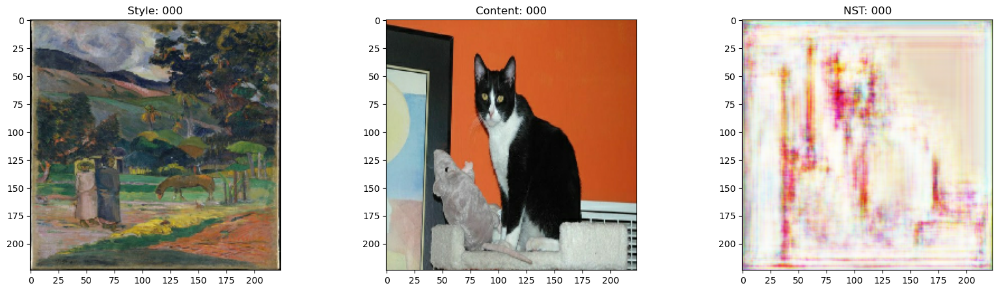

50/50 ━━━━━━━━━━━━━━━━━━━━ 2068s 42s/step - content_loss: 149.0307 - style_loss: 239.0406 - total_loss: 388.0714 - val_content_loss: 127.0989 - val_style_loss: 158.0114 - val_total_loss: 285.1103


In [79]:
optimizer = keras.optimizers.Adam(learning_rate=1e-5)
loss_fn = keras.losses.MeanSquaredError()

encoder = get_encoder()
loss_net = get_loss_net()
decoder = get_decoder()

model = NeuralStyleTransfer(
    encoder=encoder, decoder=decoder, loss_net=loss_net, style_weight=4.0
)

model.compile(optimizer=optimizer, loss_fn=loss_fn)

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    steps_per_epoch=10,
    validation_data=val_ds,
    validation_steps=10,
    callbacks=[TrainMonitor()],
)

2024-06-24 22:10:59.679124: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


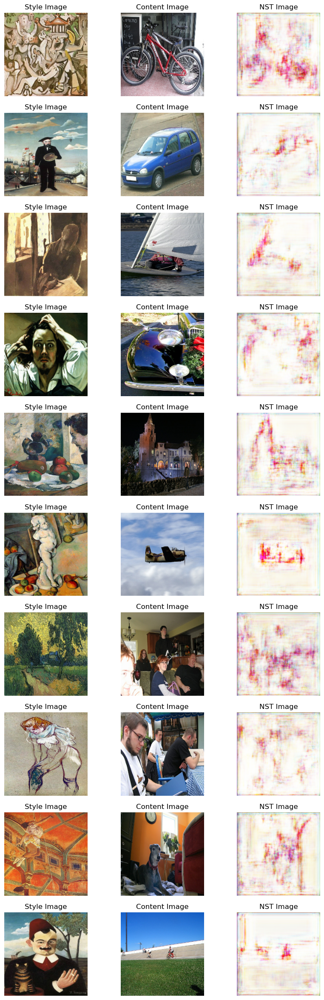

In [80]:
for style, content in test_ds.take(1):
    style_encoded = model.encoder(style)
    content_encoded = model.encoder(content)
    t = ada_in(style=style_encoded, content=content_encoded)
    reconstructed_image = model.decoder(t)
    fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 30))
    [ax.axis("off") for ax in np.ravel(axes)]

    for axis, style_image, content_image, reconstructed_image in zip(
        axes, style[0:10], content[0:10], reconstructed_image[0:10]
    ):
        (ax_style, ax_content, ax_reconstructed) = axis
        ax_style.imshow(style_image)
        ax_style.set_title("Style Image")
        ax_content.imshow(content_image)
        ax_content.set_title("Content Image")
        ax_reconstructed.imshow(reconstructed_image)
        ax_reconstructed.set_title("NST Image")

### Conclusion

The model succesffully implemented style transfer, however it lacked additional training. Due to computational constraints, I was not able to train for more
than one epoch. 